# Census Income Project

###### Problem Statement:

This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0)). The prediction task is to determine whether a person makes over $50K a year.

### Description of fnlwgt (final weight)

The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian non-institutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau. We use 3 sets of controls. These are:

1. A single cell estimate of the population 16+ for each state.
2. Controls for Hispanic Origin by age and sex.
3. Controls by Race, age and sex.

We use all three sets of controls in our weighting program and "rake" through them 6 times so that by the end we come back to all the controls we used. The term estimate refers to population totals derived from CPS by creating "weighted tallies" of any specified socio-economic characteristics of the population. People with similar demographic characteristics should have similar weights. There is one important caveat to remember about this statement. That is that since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

### Import Basic Libraries

In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('census_income.csv')

In [3]:
df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [4]:
#shape of data
df.shape

(32560, 15)

32560 rows and 15 columns

In [10]:
#checking datatypes of all columns
df.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income            object
dtype: object

6 are integers and others are objects

In [5]:
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

### About Columns:-

###### 1. Age

In this column contain the Age of the person

###### 2. Workclass

This column is about workclass of Person

###### 3. Fnlwgt

This column is about final weight of the person

###### 4. Education

In this column contain the Education qualification

###### 5. Education_num

This column is about Education Number for each person

###### 6. Marital_status

This column is about Marital status like single,married and divorced.

###### 7.Occupation

This column is about occupation of that person

###### 8. Relationship

This column is about relationship with other person like wife,husband ,etc.

###### 9. Race

This column is about color like white or black.

###### 10. Sex 

This column is about gender of that person

###### 11. Capital_gain

This column is about capital gain of that person

###### 12. Capital_loss

This column is about capital loss of that person

###### 13. Hours_per_week

This column is about how much time that person is working in a week 

###### 14. Native_country

This column is about native country of that person

###### 15. Income

This is the Target column and this column is about income of that person

In [9]:
#checking spaces in data
for x in df.columns:
    print(df.loc[df[x]==" "])

Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_num, Marital_status, Occupation, Relationship, Race, Sex, Capital_gain, Capital_loss, Hours_per_week, Native_country, Income]
Index: []
Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_num, Marital_status, Occupation, Relationship, Race, Sex, Capital_gain, Capital_loss, Hours_per_week, Native_country, Income]
Index: []
Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_num, Marital_status, Occupation, Relationship, Race, Sex, Capital_gain, Capital_loss, Hours_per_week, Native_country, Income]
Index: []
Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_num, Marital_status, Occupation, Relationship, Race, Sex, Capital_gain, Capital_loss, Hours_per_week, Native_country, Income]
Index: []
Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_num, Marital_status, Occupation, Relationship, Race, Sex, Capital_gain, Capital_loss, Hours_per_week,

All are Empty DataFrames , Then is no spaces in data.

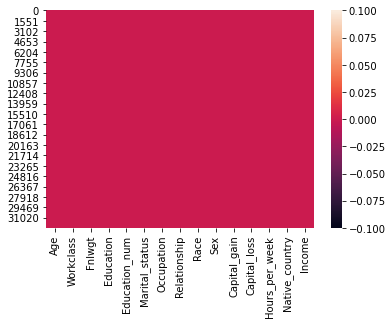

In [16]:
#checking null values using heatmap
sns.heatmap(df.isnull());

In [17]:
#checking null values count
df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

There is no null values

In [12]:
#checking infomation of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


###### Observations:-

1. RangeIndex: 32560 entries, 0 to 32559
2. Data columns (total 15 columns)
3. There is no null values
4. 6 columns are int64 type
5. 9 column are object type
6. Memory usage is 3.7+MB

In [15]:
#counting uniques of all columns
df.nunique()

Age                  73
Workclass             9
Fnlwgt            21647
Education            16
Education_num        16
Marital_status        7
Occupation           15
Relationship          6
Race                  5
Sex                   2
Capital_gain        119
Capital_loss         92
Hours_per_week       94
Native_country       42
Income                2
dtype: int64

Target column as 2 unique means this is classification 

###### Unique And Value Count information

In [34]:
print(df['Workclass'].unique())
print(df['Workclass'].value_counts())

[' Self-emp-not-inc' ' Private' ' State-gov' ' Federal-gov' ' Local-gov'
 ' ?' ' Self-emp-inc' ' Without-pay' ' Never-worked']
 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1297
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: Workclass, dtype: int64


###### fill ? with mode

In [35]:
#Here private is the highest mode
df['Workclass']=df['Workclass'].replace(' ?','Private')

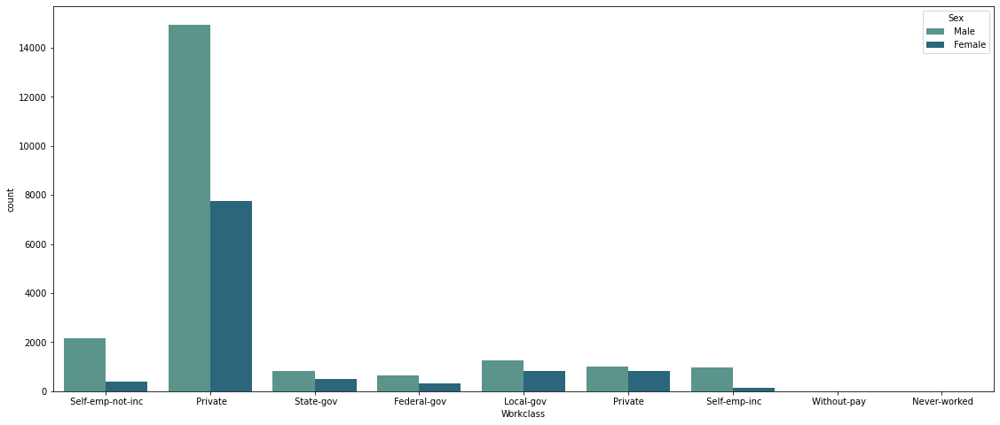

In [39]:
#countplot
plt.figure(figsize=(19,8))
sns.countplot(df['Workclass'],palette='crest',hue='Sex',data=df);

If you observe private workclass persons are high . That to male persons are high in all workclass.

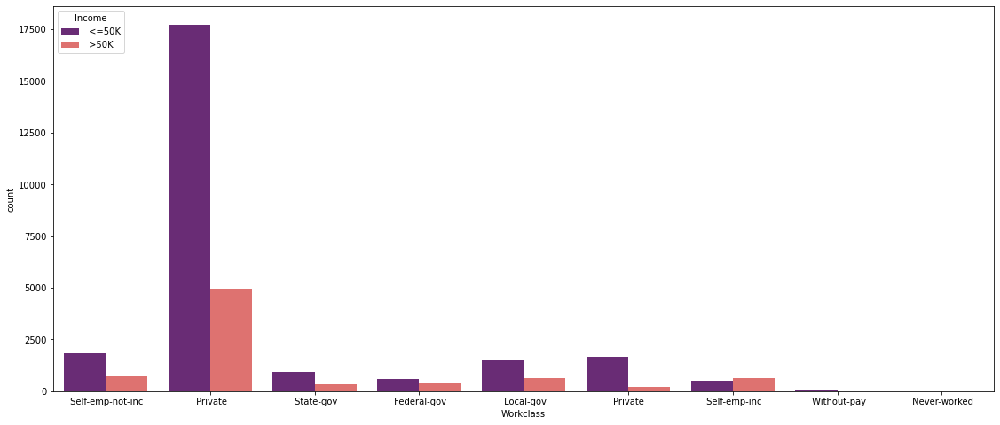

In [55]:
#countplot
plt.figure(figsize=(19,8))
sns.countplot(df['Workclass'],palette='magma',hue='Income',data=df);

<=50K Income is high in private

In [44]:
#checking unique
print(df['Education'].unique())
#counting unique values
print(df['Education'].value_counts())

[' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' Assoc-voc' ' 7th-8th' ' Doctorate' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']
 HS-grad         10501
 Some-college     7291
 Bachelors        5354
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool          51
Name: Education, dtype: int64


###### Feature Engineering

In [45]:
df['Education']=df['Education'].replace([' 1st-4th',' 5th-6th',' Prof-school',' Preschool',' 7th-8th',' 9th',' 10th',' 11th',' 12th'],'school')
df['Education']=df['Education'].replace([' HS-grad',' Assoc-acdm',' Assoc-voc',' Some-college',' Bachelors'],'college')

In [46]:
#checking unique values
df['Education'].unique()

array(['college', 'school', ' Masters', ' Doctorate'], dtype=object)

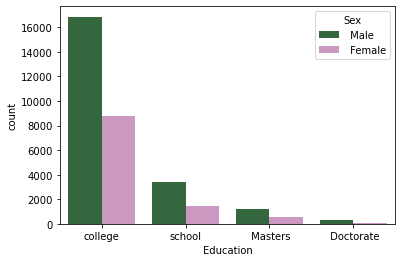

In [50]:
#countplot of Education
sns.countplot(df['Education'],palette='cubehelix',hue='Sex',data=df);

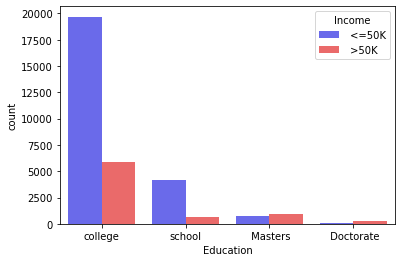

In [56]:
#countplot of Education
sns.countplot(df['Education'],palette='seismic',hue='Income',data=df);

In [52]:
#checking unique
print(df['Education_num'].unique())
#counting unique
print(df['Education_num'].value_counts())

[13  9  7 14  5 10 12 11  4 16 15  3  6  2  1  8]
9     10501
10     7291
13     5354
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: Education_num, dtype: int64


In [57]:
#checking unique
print(df['Marital_status'].unique())
#counting unique
print(df['Marital_status'].value_counts())

[' Married-civ-spouse' ' Divorced' ' Married-spouse-absent'
 ' Never-married' ' Separated' ' Married-AF-spouse' ' Widowed']
 Married-civ-spouse       14976
 Never-married            10682
 Divorced                  4443
 Separated                 1025
 Widowed                    993
 Married-spouse-absent      418
 Married-AF-spouse           23
Name: Marital_status, dtype: int64


###### Feature Engineering

In [59]:
df['Marital_status']=df['Marital_status'].replace([' Married-civ-spouse',' Married-spouse-absent',' Married-AF-spouse'],'married')
df['Marital_status']=df['Marital_status'].replace([' Divorced',' Separated'],'Divorced')
df['Marital_status']=df['Marital_status'].replace(' Never-married','singles')

In [60]:
#checking unique
print(df['Marital_status'].unique())
#counting unique
print(df['Marital_status'].value_counts())

['married' 'Divorced' 'singles' ' Widowed']
married     15417
singles     10682
Divorced     5468
 Widowed      993
Name: Marital_status, dtype: int64


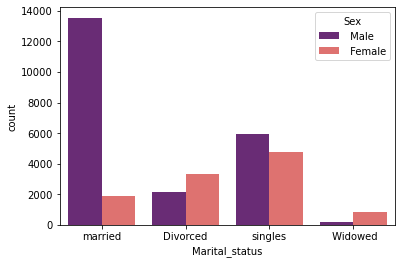

In [62]:
#count plot
sns.countplot(df['Marital_status'],palette='magma',hue='Sex',data=df);

Married Male persons are high here.

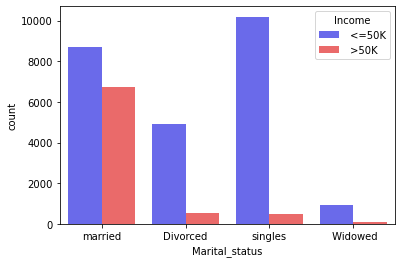

In [64]:
#count plot
sns.countplot(df['Marital_status'],palette='seismic',hue='Income',data=df);

If you observe here singles are many people that getting <=50k

In [65]:
#checking unique
print(df['Occupation'].unique())
#counting unique
print(df['Occupation'].value_counts())

[' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Adm-clerical' ' Sales' ' Craft-repair'
 ' Transport-moving' ' Farming-fishing' ' Machine-op-inspct'
 ' Tech-support' ' ?' ' Protective-serv' ' Armed-Forces'
 ' Priv-house-serv']
 Prof-specialty       4140
 Craft-repair         4099
 Exec-managerial      4066
 Adm-clerical         3769
 Sales                3650
 Other-service        3295
 Machine-op-inspct    2002
 ?                    1843
 Transport-moving     1597
 Handlers-cleaners    1370
 Farming-fishing       994
 Tech-support          928
 Protective-serv       649
 Priv-house-serv       149
 Armed-Forces            9
Name: Occupation, dtype: int64


###### fill ? with mode

In [70]:
df['Occupation']=df['Occupation'].replace(' ?',' Prof-specialty')

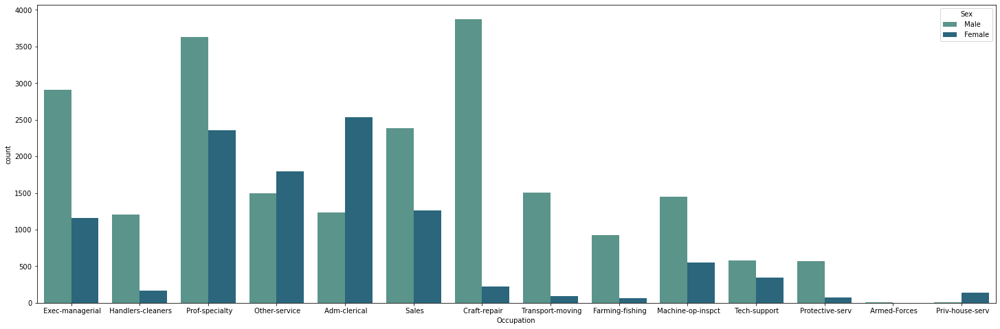

In [74]:
#count plot
plt.figure(figsize=(25,8))
sns.countplot(df['Occupation'],palette='crest',hue='Sex',data=df);

If you observe here females are high in others services and Adm-Clerical

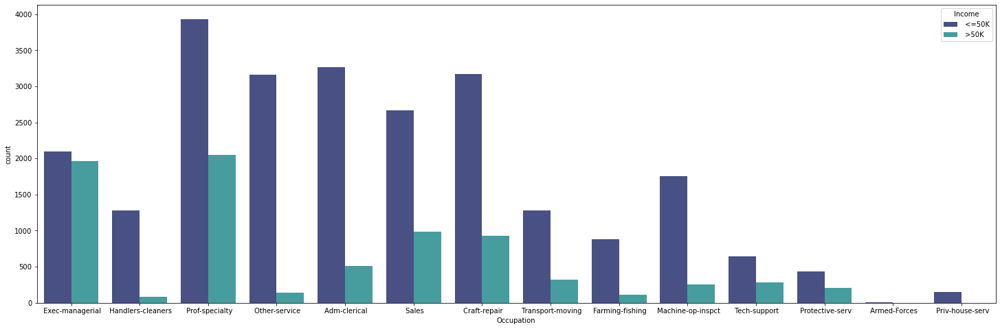

In [72]:
#count plot
plt.figure(figsize=(25,8))
sns.countplot(df['Occupation'],palette='mako',hue='Income',data=df);

All occupations <=50k persons are high

In [75]:
#checking unique
print(df['Relationship'].unique())
#counting unique
print(df['Relationship'].value_counts())

[' Husband' ' Not-in-family' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']
 Husband           13193
 Not-in-family      8304
 Own-child          5068
 Unmarried          3446
 Wife               1568
 Other-relative      981
Name: Relationship, dtype: int64


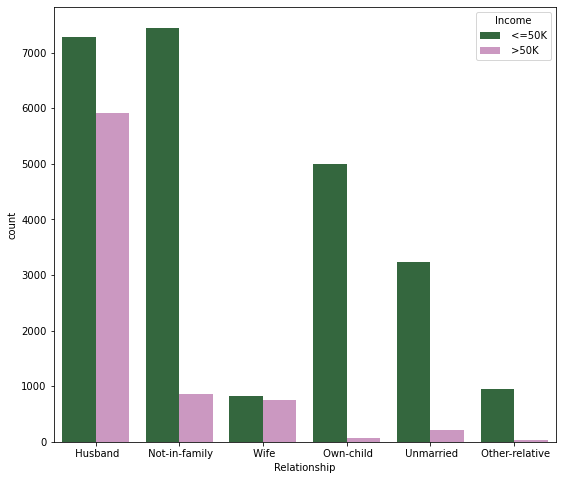

In [79]:
#count plot
plt.figure(figsize=(9,8))
sns.countplot(df['Relationship'],palette='cubehelix',hue='Income',data=df);

Not in family relationship are many perons get <=50k income 

In [80]:
#checking unique
print(df['Race'].unique())
#counting unique
print(df['Race'].value_counts())

[' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' ' Other']
 White                 27815
 Black                  3124
 Asian-Pac-Islander     1039
 Amer-Indian-Eskimo      311
 Other                   271
Name: Race, dtype: int64


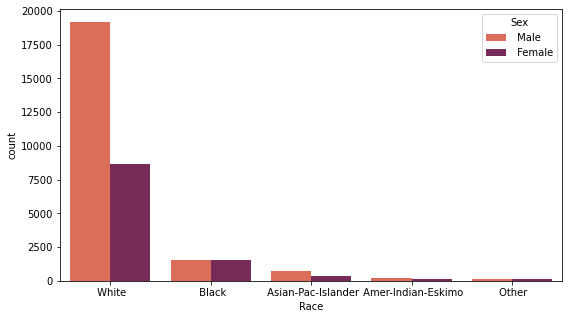

In [86]:
#count plot
plt.figure(figsize=(9,5))
sns.countplot(df['Race'],palette='rocket_r',hue='Sex',data=df);

White perons are many here that to male persons are high count

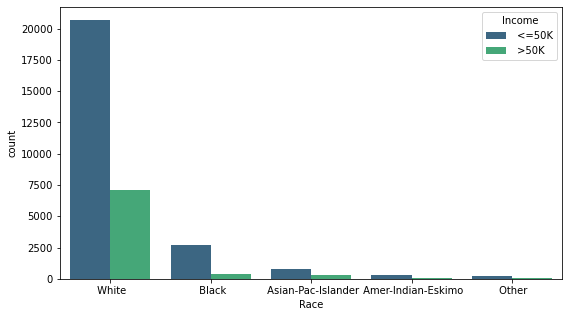

In [87]:
#count plot
plt.figure(figsize=(9,5))
sns.countplot(df['Race'],palette='viridis',hue='Income',data=df);

In [88]:
#checking unique
print(df['Sex'].unique())
#counting unique
print(df['Sex'].value_counts())

[' Male' ' Female']
 Male      21789
 Female    10771
Name: Sex, dtype: int64


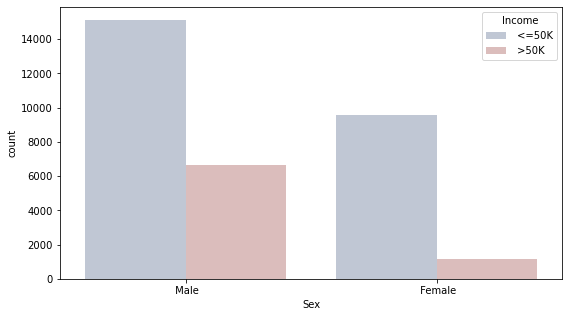

In [89]:
#count plot
plt.figure(figsize=(9,5))
sns.countplot(df['Sex'],palette='vlag',hue='Income',data=df);

Males are high count in <=50k income

In [93]:
#checking unique
print(df['Native_country'].unique())
#counting unique
print(df['Native_country'].value_counts())

[' United-States' ' Cuba' ' Jamaica' ' India' ' ?' ' Mexico' ' South'
 ' Puerto-Rico' ' Honduras' ' England' ' Canada' ' Germany' ' Iran'
 ' Philippines' ' Italy' ' Poland' ' Columbia' ' Cambodia' ' Thailand'
 ' Ecuador' ' Laos' ' Taiwan' ' Haiti' ' Portugal' ' Dominican-Republic'
 ' El-Salvador' ' France' ' Guatemala' ' China' ' Japan' ' Yugoslavia'
 ' Peru' ' Outlying-US(Guam-USVI-etc)' ' Scotland' ' Trinadad&Tobago'
 ' Greece' ' Nicaragua' ' Vietnam' ' Hong' ' Ireland' ' Hungary'
 ' Holand-Netherlands']
 United-States                 29169
 Mexico                          643
 ?                               583
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China 

###### fill ? with mode

In [94]:
df['Native_country']=df['Native_country'].replace(' ?',' United-States')

In [97]:
#checking unique
print(df['Native_country'].unique())
#counting unique
print(df['Native_country'].value_counts())

[' United-States' ' Cuba' ' Jamaica' ' India' ' Mexico' ' South'
 ' Puerto-Rico' ' Honduras' ' England' ' Canada' ' Germany' ' Iran'
 ' Philippines' ' Italy' ' Poland' ' Columbia' ' Cambodia' ' Thailand'
 ' Ecuador' ' Laos' ' Taiwan' ' Haiti' ' Portugal' ' Dominican-Republic'
 ' El-Salvador' ' France' ' Guatemala' ' China' ' Japan' ' Yugoslavia'
 ' Peru' ' Outlying-US(Guam-USVI-etc)' ' Scotland' ' Trinadad&Tobago'
 ' Greece' ' Nicaragua' ' Vietnam' ' Hong' ' Ireland' ' Hungary'
 ' Holand-Netherlands']
 United-States                 29752
 Mexico                          643
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy      

United-States persons are many here

In [99]:
#checking unique
print(df['Income'].unique())
#counting unique
print(df['Income'].value_counts())

[' <=50K' ' >50K']
 <=50K    24719
 >50K      7841
Name: Income, dtype: int64


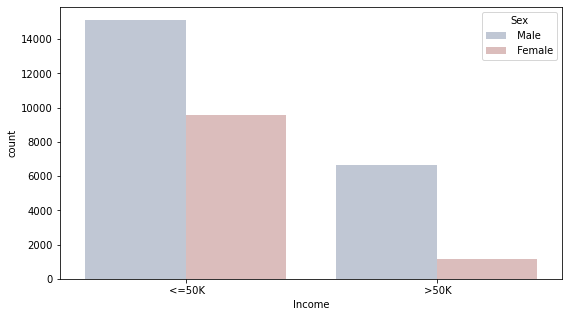

In [100]:
#count plot
plt.figure(figsize=(9,5))
sns.countplot(df['Income'],palette='vlag',hue='Sex',data=df);

Males are high count in getting <=50k income

In [101]:
df['Income']=df['Income'].replace(' >50K',0)
df['Income']=df['Income'].replace(' <=50K',1)

In [102]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,32560.0,38.581634,13.640642,17.0,28.0,37.0,48.0,90.0
Fnlwgt,32560.0,189781.814373,105549.764924,12285.0,117831.5,178363.0,237054.5,1484705.0
Education_num,32560.0,10.080590,2.572709,1.0,9.0,10.0,12.0,16.0
Capital_gain,32560.0,1077.615172,7385.402999,0.0,0.0,0.0,0.0,99999.0
Capital_loss,32560.0,87.306511,402.966116,0.0,0.0,0.0,0.0,4356.0
Hours_per_week,32560.0,40.437469,12.347618,1.0,40.0,40.0,45.0,99.0
Income,32560.0,0.759183,0.427586,0.0,1.0,1.0,1.0,1.0


### Histogram

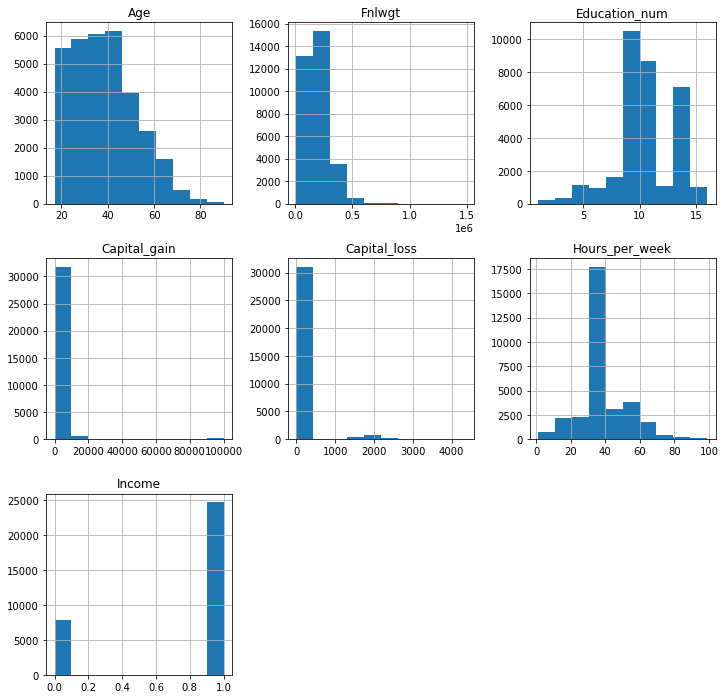

In [109]:
df.hist(figsize=(12,12),layout=(3,3),sharex=False);

### Pie Chart

In [112]:
px.pie(df,values='Education_num',names='Education',title='% of education',color_discrete_sequence=px.colors.qualitative.T10)

In [114]:
px.pie(df,values='Age',names='Marital_status',title='% of Marital_status',color_discrete_sequence=px.colors.qualitative.T10)

In [119]:
px.pie(df,values='Capital_gain',names='Education',title='% of Education',color_discrete_sequence=px.colors.qualitative.T10)

In [120]:
px.pie(df,values='Capital_loss',names='Education',title='% of Education',color_discrete_sequence=px.colors.qualitative.T10)

In [121]:
px.pie(df,values='Hours_per_week',names='Education',title='% of Education',color_discrete_sequence=px.colors.qualitative.T10)

In [122]:
px.pie(df,values='Hours_per_week',names='Native_country',title='% of Native_country',color_discrete_sequence=px.colors.qualitative.T10)

### Label Encoder

In [123]:
from sklearn.preprocessing import LabelEncoder

In [125]:
df.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income             int64
dtype: object

In [127]:
df1=df.copy()

In [128]:
df1=df1.apply(LabelEncoder().fit_transform)

In [130]:
df1

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,33,5,2925,2,12,2,3,0,4,1,0,0,12,38,1
1,21,3,14085,2,8,1,5,1,4,1,0,0,39,38,1
2,36,3,15335,3,6,2,5,0,2,1,0,0,39,38,1
3,11,3,19354,2,12,2,9,5,2,0,0,0,39,4,1
4,20,3,17699,1,13,2,3,5,4,0,0,0,39,38,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,10,3,16527,2,11,2,12,5,4,0,0,0,37,38,1
32556,23,3,8079,2,8,2,6,0,4,1,0,0,39,38,0
32557,41,3,7882,2,8,0,0,4,4,0,0,0,39,38,1
32558,5,3,12880,2,8,3,0,3,4,1,0,0,19,38,1


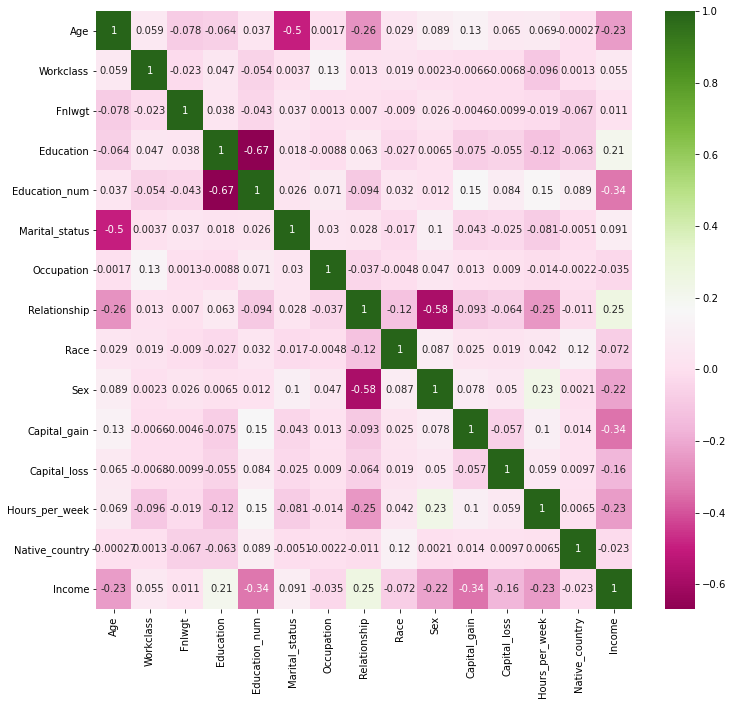

In [135]:
#checking correlation using HeatMap
plt.figure(figsize=(12,11))
sns.heatmap(df1.corr(),annot=True,cmap='PiYG');

In [139]:
#correlation
df1.corr()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
Age,1.000000,0.059426,-0.078466,-0.063818,0.036547,-0.498325,0.001742,-0.263783,0.028751,0.088863,0.125916,0.065058,0.069123,-0.000266,-0.234136
Workclass,0.059426,1.000000,-0.022635,0.046755,-0.054412,0.003743,0.133420,0.012832,0.018893,0.002270,-0.006636,-0.006829,-0.096325,0.001287,0.055098
Fnlwgt,-0.078466,-0.022635,1.000000,0.038419,-0.042806,0.037207,0.001282,0.007005,-0.008964,0.025787,-0.004562,-0.009912,-0.019168,-0.067040,0.010573
Education,-0.063818,0.046755,0.038419,1.000000,-0.669002,0.017507,-0.008754,0.062808,-0.026507,0.006466,-0.075487,-0.055430,-0.116988,-0.063085,0.209981
Education_num,0.036547,-0.054412,-0.042806,-0.669002,1.000000,0.026404,0.071012,-0.094145,0.031825,0.012256,0.154387,0.084175,0.150098,0.088887,-0.335182
Marital_status,-0.498325,0.003743,0.037207,0.017507,0.026404,1.000000,0.030301,0.028287,-0.017416,0.104950,-0.042734,-0.025240,-0.080507,-0.005082,0.090757
Occupation,0.001742,0.133420,0.001282,-0.008754,0.071012,0.030301,1.000000,-0.037465,-0.004821,0.047497,0.012963,0.008955,-0.014158,-0.002205,-0.034599
Relationship,-0.263783,0.012832,0.007005,0.062808,-0.094145,0.028287,-0.037465,1.000000,-0.116052,-0.582453,-0.093141,-0.064286,-0.251353,-0.010710,0.250924
Race,0.028751,0.018893,-0.008964,-0.026507,0.031825,-0.017416,-0.004821,-0.116052,1.000000,0.087197,0.024951,0.019366,0.042318,0.116526,-0.071853
Sex,0.088863,0.002270,0.025787,0.006466,0.012256,0.104950,0.047497,-0.582453,0.087197,1.000000,0.077573,0.049549,0.231357,0.002055,-0.215995


###### Observations:-

1. Marital_status are highly negative correlation with Age
2. Relatonship also high negative correlation with Age
3. Capital_gain is positive correlation with Age
3. Education is highly negative correlation with Education_num
4. Sex is Highly Negative correlation with Relationship
5. Sex is Positive correlation with Hours_per_week
6. Capital_gain and Hours_per_week is positive correlation with Education_num

In [141]:
df_target=df1.corr()

In [143]:
df_target['Income'].sort_values(ascending=False)

Income            1.000000
Relationship      0.250924
Education         0.209981
Marital_status    0.090757
Workclass         0.055098
Fnlwgt            0.010573
Native_country   -0.023063
Occupation       -0.034599
Race             -0.071853
Capital_loss     -0.162511
Sex              -0.215995
Hours_per_week   -0.232394
Age              -0.234136
Education_num    -0.335182
Capital_gain     -0.340034
Name: Income, dtype: float64

###### Observations:-

1. Relationship And Education is high positive correlation with Income 
2. Marital_status and Workclass also little bit positive correlation with Income
3. Capital_gain and Education Num is highly Negative correlation with Income

###### Unique Count of Target Variable

In [144]:
#checking unique count bcz to check that dataset is balanced or not
df['Income'].value_counts()

1    24719
0     7841
Name: Income, dtype: int64

This is imbalanced Dataset Apply SMOTE to make it balanced

### SMOTE

In [145]:
from imblearn.over_sampling import SMOTE

In [151]:
dfx=df1.drop('Income',axis=1)
dfy=df['Income']

In [152]:
dfx

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,33,5,2925,2,12,2,3,0,4,1,0,0,12,38
1,21,3,14085,2,8,1,5,1,4,1,0,0,39,38
2,36,3,15335,3,6,2,5,0,2,1,0,0,39,38
3,11,3,19354,2,12,2,9,5,2,0,0,0,39,4
4,20,3,17699,1,13,2,3,5,4,0,0,0,39,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,10,3,16527,2,11,2,12,5,4,0,0,0,37,38
32556,23,3,8079,2,8,2,6,0,4,1,0,0,39,38
32557,41,3,7882,2,8,0,0,4,4,0,0,0,39,38
32558,5,3,12880,2,8,3,0,3,4,1,0,0,19,38


In [153]:
dfy

0        1
1        1
2        1
3        1
4        1
        ..
32555    1
32556    0
32557    1
32558    1
32559    0
Name: Income, Length: 32560, dtype: int64

In [150]:
smt=SMOTE()

In [154]:
trainx,trainy=smt.fit_resample(dfx,dfy)

In [157]:
#value count of target variable
trainy.value_counts()

0    24719
1    24719
Name: Income, dtype: int64

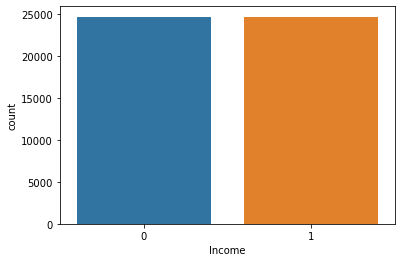

In [159]:
#count plot
sns.countplot(trainy);

Now dataset is balanced

In [161]:
#making dataframe
df1=pd.DataFrame(trainx)

In [162]:
#dependent variables
df1

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,33,5,2925,2,12,2,3,0,4,1,0,0,12,38
1,21,3,14085,2,8,1,5,1,4,1,0,0,39,38
2,36,3,15335,3,6,2,5,0,2,1,0,0,39,38
3,11,3,19354,2,12,2,9,5,2,0,0,0,39,4
4,20,3,17699,1,13,2,3,5,4,0,0,0,39,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49433,7,3,72,2,10,2,2,0,4,1,0,0,30,38
49434,26,1,13630,1,13,3,10,1,2,0,97,0,46,38
49435,20,3,15785,2,10,2,4,0,3,1,94,0,39,38
49436,35,2,11594,2,8,2,6,0,4,1,0,0,39,38


In [163]:
#adding target variable
df1['Income']=trainy

In [164]:
#after adding target variable
df1

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,33,5,2925,2,12,2,3,0,4,1,0,0,12,38,1
1,21,3,14085,2,8,1,5,1,4,1,0,0,39,38,1
2,36,3,15335,3,6,2,5,0,2,1,0,0,39,38,1
3,11,3,19354,2,12,2,9,5,2,0,0,0,39,4,1
4,20,3,17699,1,13,2,3,5,4,0,0,0,39,38,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49433,7,3,72,2,10,2,2,0,4,1,0,0,30,38,0
49434,26,1,13630,1,13,3,10,1,2,0,97,0,46,38,0
49435,20,3,15785,2,10,2,4,0,3,1,94,0,39,38,0
49436,35,2,11594,2,8,2,6,0,4,1,0,0,39,38,0


In [174]:
#checking shape
df1.shape

(49438, 15)

49438 rows and 15 columns

In [165]:
#checking null values
df1.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

###### Checking Outliers

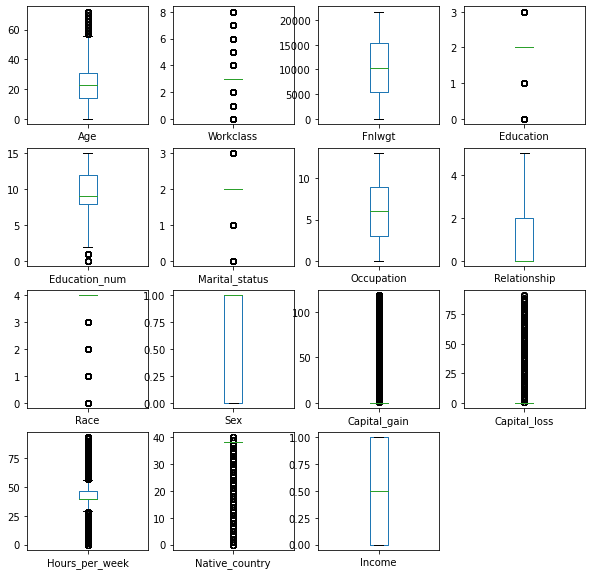

In [167]:
df1.plot(kind='box',subplots=True,layout=(4,4),figsize=(10,10));

###### Removing Outliers

In [168]:
from scipy.stats import zscore

In [169]:
z=np.abs(zscore(df1))

In [170]:
threshold=3
print(np.where(z>3))

(array([    3,     7,     9, ..., 49429, 49430, 49432], dtype=int64), array([13, 10, 12, ..., 11, 11, 10], dtype=int64))


In [171]:
z[3][13]

6.022537630630864

In [172]:
#removing outliers
df_new=df1[(z<3).all(axis=1)]

In [173]:
#after removing outliers
df_new

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,33,5,2925,2,12,2,3,0,4,1,0,0,12,38,1
1,21,3,14085,2,8,1,5,1,4,1,0,0,39,38,1
2,36,3,15335,3,6,2,5,0,2,1,0,0,39,38,1
4,20,3,17699,1,13,2,3,5,4,0,0,0,39,38,1
5,32,3,8535,3,4,2,7,1,2,0,0,0,15,22,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49433,7,3,72,2,10,2,2,0,4,1,0,0,30,38,0
49434,26,1,13630,1,13,3,10,1,2,0,97,0,46,38,0
49435,20,3,15785,2,10,2,4,0,3,1,94,0,39,38,0
49436,35,2,11594,2,8,2,6,0,4,1,0,0,39,38,0


In [175]:
#after removing outliers checking shape
df_new.shape

(39129, 15)

39129 rows and 15 columns

###### Checking Skewness

In [176]:
#dependent variables
x=df_new.iloc[:,0:-1]
y=df_new.iloc[:,-1]

In [177]:
#checking shapes
print(x.shape)
print(y.shape)

(39129, 14)
(39129,)


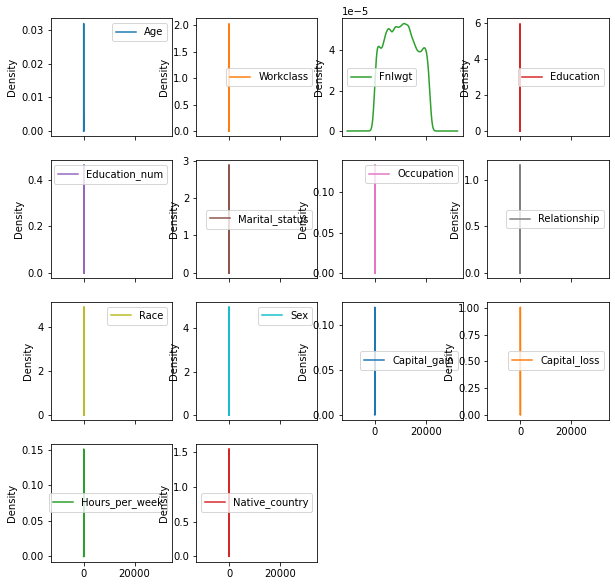

In [178]:
x.plot(kind='kde',subplots=True,layout=(4,4),figsize=(10,10));

In [180]:
x.skew().sort_values(ascending=False)

Capital_loss      8.095436
Capital_gain      2.957746
Relationship      1.124688
Age               0.239364
Occupation        0.119809
Fnlwgt            0.056721
Workclass         0.025996
Education        -0.130991
Education_num    -0.220124
Hours_per_week   -0.255993
Marital_status   -0.405487
Sex              -0.846237
Race             -2.554015
Native_country   -5.973503
dtype: float64

There is high skewness in data

###### Removing Skewness 

In [181]:
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

In [182]:
scaler=MinMaxScaler(feature_range=(1,2))
power=PowerTransformer(method='box-cox')
pipeline=Pipeline(steps=[('s',scaler),('p',power)])

In [183]:
data=pipeline.fit_transform(x)

In [184]:
#make dataframe
x=pd.DataFrame(data,columns=x.columns)

In [187]:
x

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,0.900438,1.762899,-1.296491,0.043052,1.239688,-0.092742,-0.725695,-0.878000,0.369641,0.662723,-0.333135,-0.155511,-2.737896,0.167645
1,-0.078692,-0.007437,0.611845,0.043052,-0.675432,-1.447537,-0.171435,0.426786,0.369641,0.662723,-0.333135,-0.155511,-0.213270,0.167645
2,1.129712,-0.007437,0.810305,2.407932,-1.540253,-0.092742,-0.171435,-0.878000,-2.719388,0.662723,-0.333135,-0.155511,-0.213270,0.167645
3,-0.165279,-0.007437,1.178791,-2.109536,1.754921,-0.092742,-0.725695,1.657494,0.369641,-1.508927,-0.333135,-0.155511,-0.213270,0.167645
4,0.822733,-0.007437,-0.303400,2.407932,-2.338370,-0.092742,0.345869,0.426786,-2.719388,-1.508927,-0.333135,-0.155511,-2.482742,-4.333596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39124,-1.375738,-0.007437,-1.834534,0.043052,0.252276,-0.092742,-1.019023,-0.878000,0.369641,0.662723,-0.333135,-0.155511,-1.110547,0.167645
39125,0.342161,-1.749972,0.538952,-2.109536,1.754921,1.534669,1.064890,0.426786,-2.719388,-1.508927,3.026077,-0.155511,0.521310,0.167645
39126,-0.165279,-0.007437,0.881124,0.043052,0.252276,-0.092742,-0.443514,-0.878000,-2.659129,0.662723,3.026068,-0.155511,-0.213270,0.167645
39127,1.053915,-0.882518,0.208291,0.043052,-0.675432,-0.092742,0.091435,-0.878000,0.369641,0.662723,-0.333135,-0.155511,-0.213270,0.167645


### VIF(Variance Inflation Factor)

In [188]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [192]:
def vif():
    vif=pd.DataFrame()
    vif['Varibales']=x.columns
    vif['VIF Factor']=[variance_inflation_factor(x.values,i)for i in range(x.shape[1])]
    return vif

In [193]:
vif()

,Varibales,VIF Factor
0,Age,1.488928
1,Workclass,1.012763
2,Fnlwgt,1.021780
3,Education,1.491955
4,Education_num,1.498464
5,Marital_status,1.374667
6,Occupation,1.019256
7,Relationship,1.945348
8,Race,1.038553
9,Sex,1.705459


In [195]:
#Capital_loss and Native_country is same VIF Factor
x.drop('Capital_loss',axis=1,inplace=True)

In [196]:
#Capital_gain and Race is same VIF Factor, Capital_gain is also negative correlation with target variable
x.drop('Capital_gain',axis=1,inplace=True)

In [197]:
#Education and Education_num is Same VIF Factor , Education_num also negative correlation with target variable
x.drop('Education_num',axis=1,inplace=True)

In [198]:
#Occupation and Native_country is same VIF Factor
x.drop('Native_country',axis=1,inplace=True)

In [200]:
#checking shape of dependent variables
x.shape

(39129, 10)

39129 rows and 10 columns

### Standard Scaler

In [199]:
scale=MinMaxScaler()

In [201]:
x=scale.fit_transform(x)

In [202]:
#after applying standard scaler
x.shape

(39129, 10)

39129 rows and 10 clomuns

### Model Selection

In [203]:
#target variable shape
y.shape

(39129,)

In [204]:
#classification models
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

#Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve,roc_auc_score

In [205]:
lg=LogisticRegression()
gnb=GaussianNB()
dtc=DecisionTreeClassifier()
knc=KNeighborsClassifier()
svc=SVC()
rfc=RandomForestClassifier()
abc=AdaBoostClassifier()
gbc=GradientBoostingClassifier()

In [206]:
list_model=[lg,gnb,dtc,knc,svc,rfc,abc,gbc]

In [211]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='YlOrBr', square=True)
    plt.xlabel("predicted")
    plt.show()

In [208]:
maxacc=0
maxrn=0

for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    lg.fit(x_train,y_train)
    pred=lg.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.771445608654911 Random state:- 16


accuracy_score:- 0.771445608654911
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      6391
           1       0.72      0.80      0.76      5348

    accuracy                           0.77     11739
   macro avg       0.77      0.77      0.77     11739
weighted avg       0.78      0.77      0.77     11739



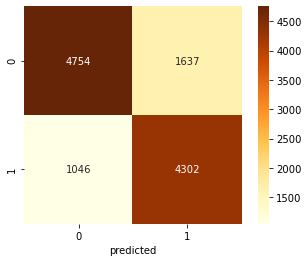

In [212]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=16)
lg.fit(x_train,y_train)
pred=lg.predict(x_test)
confusion_plot()

In [214]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Spectral', square=True)
    plt.xlabel("predicted")
    plt.show()

In [213]:
maxacc=0
maxrn=0

for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    gnb.fit(x_train,y_train)
    pred=gnb.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.771786353181702 Random state:- 54


accuracy_score:- 0.771786353181702
              precision    recall  f1-score   support

           0       0.82      0.74      0.77      6250
           1       0.73      0.81      0.77      5489

    accuracy                           0.77     11739
   macro avg       0.77      0.77      0.77     11739
weighted avg       0.78      0.77      0.77     11739



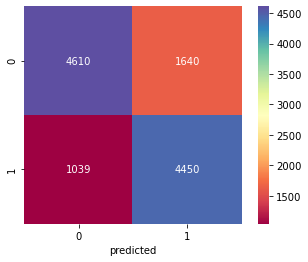

In [215]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=54)
gnb.fit(x_train,y_train)
pred=gnb.predict(x_test)
confusion_plot()

In [216]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='coolwarm', square=True)
    plt.xlabel("predicted")
    plt.show()

In [217]:
maxacc=0
maxrn=0

for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    dtc.fit(x_train,y_train)
    pred=dtc.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.8172757475083057 Random state:- 45


accuracy_score:- 0.815401652610955
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      5727
           1       0.82      0.82      0.82      6012

    accuracy                           0.82     11739
   macro avg       0.82      0.82      0.82     11739
weighted avg       0.82      0.82      0.82     11739



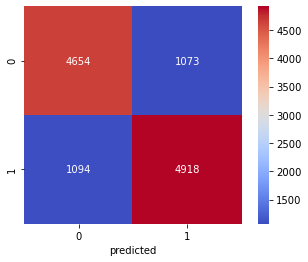

In [218]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=45)
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
confusion_plot()

In [223]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='icefire', square=True)
    plt.xlabel("predicted")
    plt.show()

In [224]:
maxacc=0
maxrn=0

for i in range(20,50):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    knc.fit(x_train,y_train)
    pred=knc.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.8305647840531561 Random state:- 25


accuracy_score:- 0.8305647840531561
              precision    recall  f1-score   support

           0       0.86      0.80      0.83      6024
           1       0.81      0.86      0.83      5715

    accuracy                           0.83     11739
   macro avg       0.83      0.83      0.83     11739
weighted avg       0.83      0.83      0.83     11739



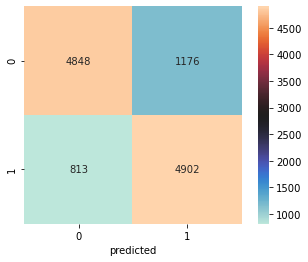

In [225]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=25)
knc.fit(x_train,y_train)
pred=knc.predict(x_test)
confusion_plot()

In [232]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Greens', square=True)
    plt.xlabel("predicted")
    plt.show()

In [228]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=43)
svc.fit(x_train,y_train)
pred=svc.predict(x_test)
accuracy_score(pred,y_test)

0.813953488372093

accuracy_score:- 0.813953488372093
              precision    recall  f1-score   support

           0       0.89      0.77      0.82      6671
           1       0.74      0.88      0.80      5068

    accuracy                           0.81     11739
   macro avg       0.82      0.82      0.81     11739
weighted avg       0.83      0.81      0.81     11739



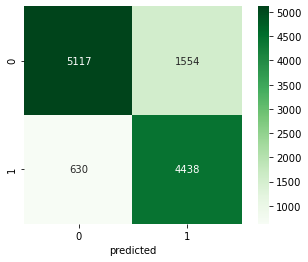

In [233]:
confusion_plot()

In [234]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='viridis', square=True)
    plt.xlabel("predicted")
    plt.show()

In [236]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=43)
rfc.fit(x_train,y_train)
pred=rfc.predict(x_test)
accuracy_score(pred,y_test)

0.8482834994462901

accuracy_score:- 0.8482834994462901
              precision    recall  f1-score   support

           0       0.86      0.83      0.85      5962
           1       0.83      0.86      0.85      5777

    accuracy                           0.85     11739
   macro avg       0.85      0.85      0.85     11739
weighted avg       0.85      0.85      0.85     11739



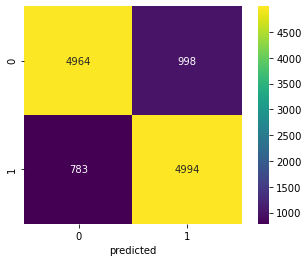

In [237]:
confusion_plot()

In [238]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='mako', square=True)
    plt.xlabel("predicted")
    plt.show()

In [240]:
maxacc=0
maxrn=0

for i in range(1,10):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    abc.fit(x_train,y_train)
    pred=abc.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.8286906891558055 Random state:- 2


accuracy_score:- 0.8286906891558055
              precision    recall  f1-score   support

           0       0.87      0.80      0.83      6299
           1       0.79      0.86      0.82      5440

    accuracy                           0.83     11739
   macro avg       0.83      0.83      0.83     11739
weighted avg       0.83      0.83      0.83     11739



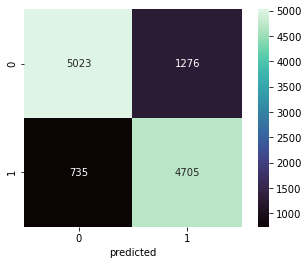

In [241]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=2)
abc.fit(x_train,y_train)
pred=abc.predict(x_test)
confusion_plot()

In [242]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='magma', square=True)
    plt.xlabel("predicted")
    plt.show()

In [245]:
maxacc=0
maxrn=0

for i in range(1,50):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=i)
    gbc.fit(x_train,y_train)
    pred=gbc.predict(x_test)
    score=accuracy_score(pred,y_test)
    if score>maxacc:
        maxacc=score
        maxrn=i
print('accuracy_score:-',maxacc,'Random state:-',maxrn)

accuracy_score:- 0.8516909447142005 Random state:- 16


accuracy_score:- 0.8516909447142005
              precision    recall  f1-score   support

           0       0.89      0.83      0.86      6235
           1       0.82      0.88      0.85      5504

    accuracy                           0.85     11739
   macro avg       0.85      0.85      0.85     11739
weighted avg       0.85      0.85      0.85     11739



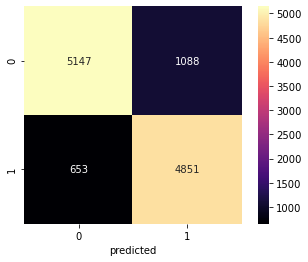

In [246]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=16)
gbc.fit(x_train,y_train)
pred=gbc.predict(x_test)
confusion_plot()

### Cross Validation

In [247]:
for model in list_model:
    score=cross_val_score(model,x,y,cv=5)
    print(model)
    print(score)
    print(score.mean())

LogisticRegression()
[0.72425249 0.75543062 0.77817531 0.77229747 0.77763578]
0.7615583346737221
GaussianNB()
[0.7457194  0.7616918  0.76680296 0.76284181 0.76370607]
0.7601524075152131
DecisionTreeClassifier()
[0.69729108 0.79248658 0.83669819 0.84666496 0.8486901 ]
0.8043661817044683
KNeighborsClassifier()
[0.74674163 0.80743675 0.85267059 0.85407616 0.8543131 ]
0.8230476440863542
SVC()
[0.76296959 0.80424227 0.8347815  0.83976489 0.83476038]
0.8153037250289646
RandomForestClassifier()
[0.73319704 0.82903143 0.88947099 0.89010989 0.89380192]
0.8471222540740335
AdaBoostClassifier()
[0.73715819 0.80705341 0.83631485 0.83401482 0.84153355]
0.8112149638013373
GradientBoostingClassifier()
[0.74086379 0.82941477 0.869793   0.86902632 0.86952077]
0.8357237291276967


### GradientBoostingClassifier is the best model

In [250]:
def confusion_plot():
    print('accuracy_score:-',accuracy_score(pred,y_test))
    print(classification_report(pred,y_test))
    matrix = confusion_matrix(pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='Greens', square=True)
    plt.xlabel("predicted")
    plt.show()

accuracy_score:- 0.8516909447142005
              precision    recall  f1-score   support

           0       0.89      0.83      0.86      6235
           1       0.82      0.88      0.85      5504

    accuracy                           0.85     11739
   macro avg       0.85      0.85      0.85     11739
weighted avg       0.85      0.85      0.85     11739



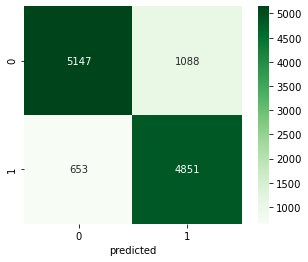

In [251]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=16)
gbc.fit(x_train,y_train)
pred=gbc.predict(x_test)
confusion_plot()

### Hyperparameters for a model

In [253]:
param_test1 = {'n_estimators':range(20,81,10)}
gsearch1 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10),param_grid = param_test1, scoring='roc_auc',n_jobs=4,cv=5)
gsearch1.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=8,
                                                  max_features='sqrt',
                                                  min_samples_leaf=50,
                                                  min_samples_split=500,
                                                  random_state=10,
                                                  subsample=0.8),
             n_jobs=4, param_grid={'n_estimators': range(20, 81, 10)},
             scoring='roc_auc')

In [276]:
print(gsearch1.best_estimator_)
print(gsearch1.best_params_)
print(gsearch1.best_score_)

GradientBoostingClassifier(max_depth=8, max_features='sqrt',
                           min_samples_leaf=50, min_samples_split=500,
                           n_estimators=80, random_state=10, subsample=0.8)
{'n_estimators': 80}
0.9336383375423951


In [299]:
gbc_pred=gsearch1.best_estimator_.predict(x_test)

In [300]:
def confusion_plot1():
    print('accuracy_score:-',accuracy_score(gbc_pred,y_test))
    print(gsearch1.best_estimator_)
    print(gsearch1.best_params_)
    print('\nClassification Report')
    print(classification_report(gbc_pred,y_test))
    matrix = confusion_matrix(gbc_pred,y_test)
    sns.heatmap(matrix, annot=True, fmt="d", cmap='icefire', square=True)
    plt.xlabel("predicted")
    plt.show()

accuracy_score:- 0.8597836272254877
GradientBoostingClassifier(max_depth=8, max_features='sqrt',
                           min_samples_leaf=50, min_samples_split=500,
                           n_estimators=80, random_state=10, subsample=0.8)
{'n_estimators': 80}

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.84      0.86      6040
           1       0.84      0.88      0.86      5699

    accuracy                           0.86     11739
   macro avg       0.86      0.86      0.86     11739
weighted avg       0.86      0.86      0.86     11739



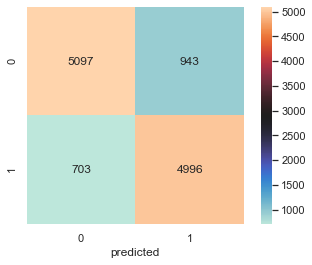

In [301]:
confusion_plot1()

### ROC Curve

In [302]:
gbc_pred=gsearch1.best_estimator_.predict_proba(x_test)

In [303]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}
n_class=2

In [304]:
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, gbc_pred[:,i], pos_label=i)

In [305]:
sns.set_theme()

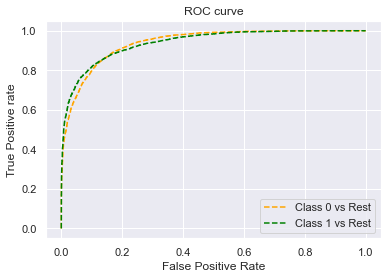

In [306]:
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('ROC Curve',dpi=300); 

### Save the Model

In [307]:
import joblib

In [308]:
#save the model
joblib.dump(gsearch1.best_estimator_,'census_income_gbc.obj')

['census_income_gbc.obj']

In [309]:
#load the model
load_model=joblib.load('census_income_gbc.obj')

In [310]:
#check that model is working or not
load_model.predict(x_test)

array([0, 1, 0, ..., 1, 0, 0], dtype=int64)